In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from scipy import stats
import statsmodels.api as sm

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**DADOS SOCIODEMOGRÁFICOS**

In [3]:
df_tihm_demog = pd.read_csv("/content/drive/MyDrive/MESTRADO/CMP Aprendizado de Máquina/DATASETS/TIHM_Dataset/Dataset/Demographics.csv", encoding='latin1', sep = ",")
df_tihm_demog.head()

,patient_id,age,sex
0,b9d58,"(70, 80]",Female
1,c55f8,"(80, 90]",Female
2,16f4b,"(80, 90]",Male
3,fd100,"(90, 110]",Female
4,1fbe4,"(80, 90]",Male


In [4]:
df_tihm_demog['age'].value_counts()

,count
age,
"(80, 90]",26
"(70, 80]",17
"(90, 110]",13


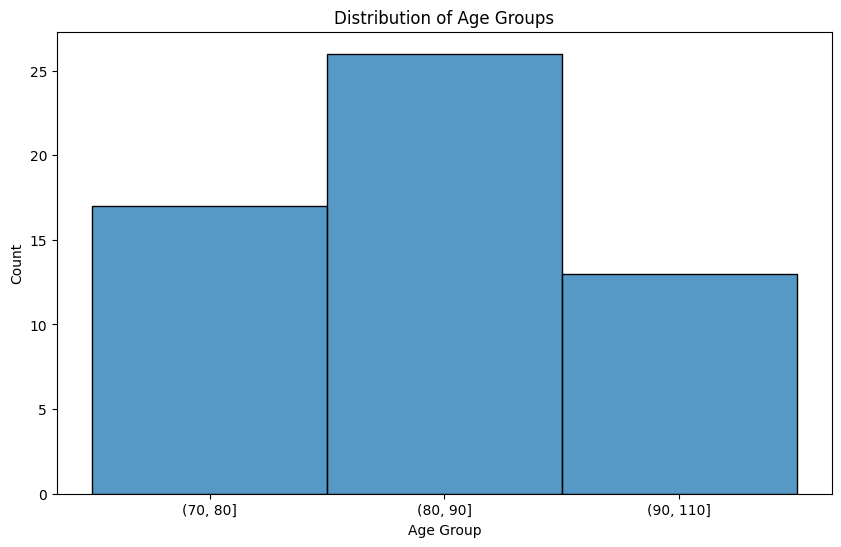

In [65]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df_tihm_demog, x='age')
plt.title('Distribution of Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

In [8]:
df_tihm_demog.describe(include = "all")

,patient_id,age,sex
count,56,56,56
unique,56,3,2
top,b9d58,"(80, 90]",Female
freq,1,26,28


In [9]:
df_tihm_demog.dtypes

,0
patient_id,object
age,object
sex,object


In [10]:
df_tihm_demog.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56 entries, 0 to 55
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  56 non-null     object
 1   age         56 non-null     object
 2   sex         56 non-null     object
dtypes: object(3)
memory usage: 1.4+ KB


In [11]:
df_tihm_demog.isnull().sum()

,0
patient_id,0
age,0
sex,0


In [12]:
len(df_tihm_demog[df_tihm_demog.duplicated()])

0

**ATIVIDADE**

In [13]:
df_timh_Activity = pd.read_csv("/content/drive/MyDrive/MESTRADO/CMP Aprendizado de Máquina/DATASETS/TIHM_Dataset/Dataset/Activity.csv", sep = ",")
df_timh_Activity.head()

,patient_id,location_name,date
0,0697d,Fridge Door,2019-06-28 13:03:29
1,0697d,Kitchen,2019-06-28 13:11:44
2,0697d,Front Door,2019-06-28 13:13:50
3,0697d,Bedroom,2019-06-28 13:13:53
4,0697d,Fridge Door,2019-06-28 13:14:09


In [14]:
df_timh_Activity.describe(include='all')

,patient_id,location_name,date
count,1030559,1030559,1030559
unique,56,8,916821
top,b9d58,Kitchen,2019-05-18 16:35:49
freq,46654,227312,6


In [15]:
df_timh_Activity['location_name'].value_counts()

,count
location_name,
Kitchen,227312
Hallway,193984
Lounge,180767
Bedroom,131133
Fridge Door,108803
Bathroom,82027
Front Door,58287
Back Door,48246


In [16]:
df_timh_Activity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030559 entries, 0 to 1030558
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   patient_id     1030559 non-null  object
 1   location_name  1030559 non-null  object
 2   date           1030559 non-null  object
dtypes: object(3)
memory usage: 23.6+ MB


In [17]:
df_timh_Activity['date'] = pd.to_datetime(df_timh_Activity['date'])

In [18]:
df_timh_Activity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030559 entries, 0 to 1030558
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   patient_id     1030559 non-null  object        
 1   location_name  1030559 non-null  object        
 2   date           1030559 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(2)
memory usage: 23.6+ MB


In [19]:
# acrescenta colunas para ano, mes, dia, hora, minuto e segundos
df_timh_Activity['year'] = df_timh_Activity['date'].dt.year
df_timh_Activity['month'] = df_timh_Activity['date'].dt.month
df_timh_Activity['day'] = df_timh_Activity['date'].dt.day
df_timh_Activity['hour'] = df_timh_Activity['date'].dt.hour
df_timh_Activity['minute'] = df_timh_Activity['date'].dt.minute
df_timh_Activity['second'] = df_timh_Activity['date'].dt.second

display(df_timh_Activity.head())

,patient_id,location_name,date,year,month,day,hour,minute,second
0,0697d,Fridge Door,2019-06-28 13:03:29,2019,6,28,13,3,29
1,0697d,Kitchen,2019-06-28 13:11:44,2019,6,28,13,11,44
2,0697d,Front Door,2019-06-28 13:13:50,2019,6,28,13,13,50
3,0697d,Bedroom,2019-06-28 13:13:53,2019,6,28,13,13,53
4,0697d,Fridge Door,2019-06-28 13:14:09,2019,6,28,13,14,9


In [22]:
# calcula o número de mudanças de comodo na casa dentro de uma hora
df_activity_hourly_changes = df_timh_Activity.groupby(['patient_id', df_timh_Activity['date'].dt.date.rename('day'), df_timh_Activity['date'].dt.hour.rename('hour')])['location_name'].nunique().reset_index()
df_activity_hourly_changes.columns = ['patient_id', 'day', 'hour', 'hourly_location_changes']
display(df_activity_hourly_changes.head())

,patient_id,day,hour,hourly_location_changes
0,0697d,2019-06-28,13,8
1,0697d,2019-06-28,14,6
2,0697d,2019-06-28,15,3
3,0697d,2019-06-28,16,2
4,0697d,2019-06-28,17,6


In [23]:
df_activity_hourly_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47531 entries, 0 to 47530
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   patient_id               47531 non-null  object
 1   day                      47531 non-null  object
 2   hour                     47531 non-null  int32 
 3   hourly_location_changes  47531 non-null  int64 
dtypes: int32(1), int64(1), object(2)
memory usage: 1.3+ MB


In [24]:
df_activity_hourly_changes.describe(include='all')

,patient_id,day,hour,hourly_location_changes
count,47531,47531,47531.000000,47531.000000
unique,56,89,NaN,NaN
top,b9d58,2019-06-28,NaN,NaN
freq,1722,904,NaN,NaN
mean,NaN,NaN,12.582904,4.175696
std,NaN,NaN,6.458090,1.911935
min,NaN,NaN,0.000000,1.000000
25%,NaN,NaN,8.000000,3.000000
50%,NaN,NaN,13.000000,4.000000
75%,NaN,NaN,18.000000,6.000000


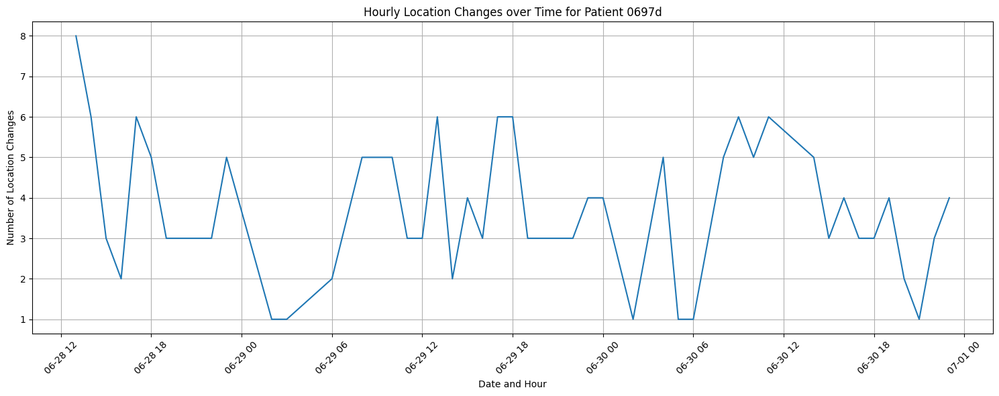

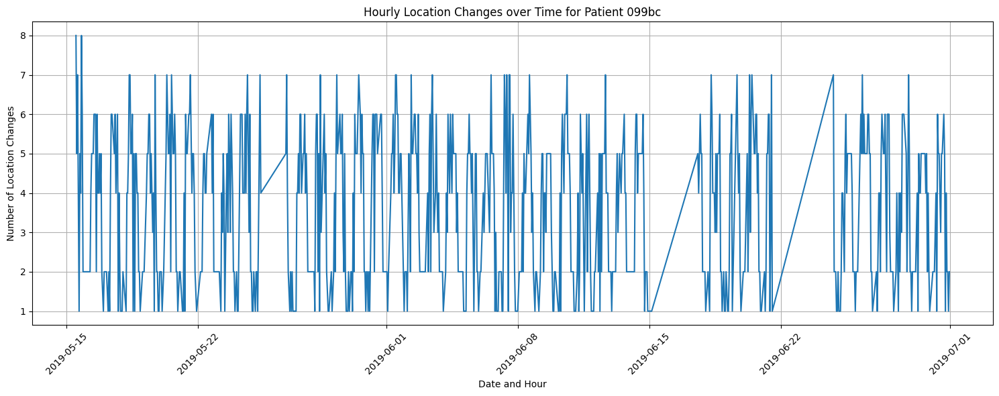

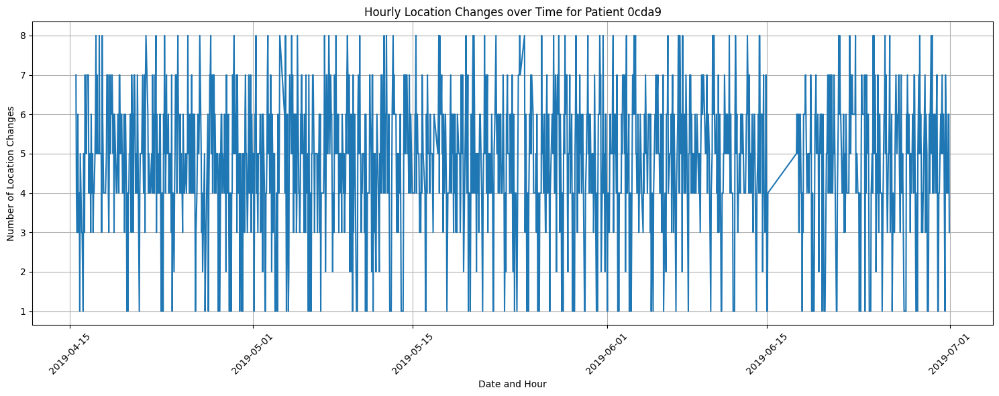

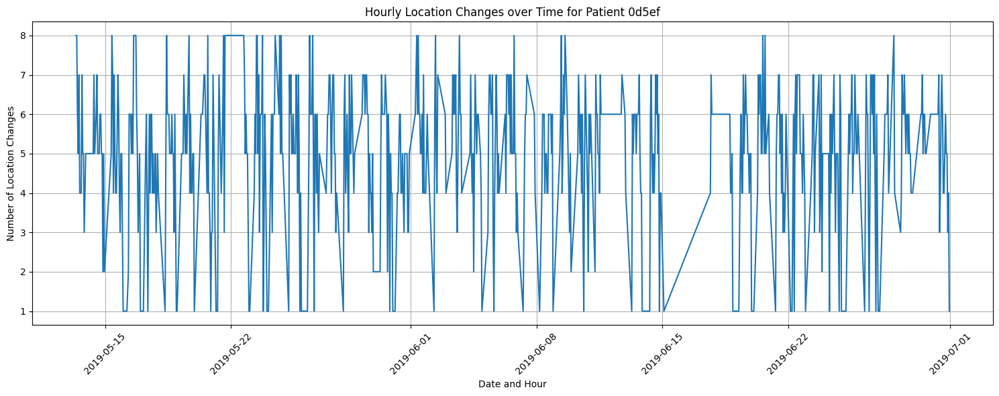

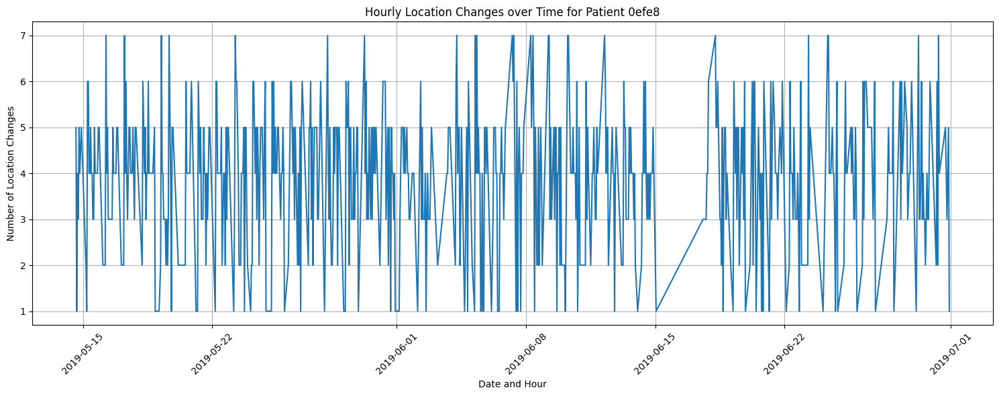

...

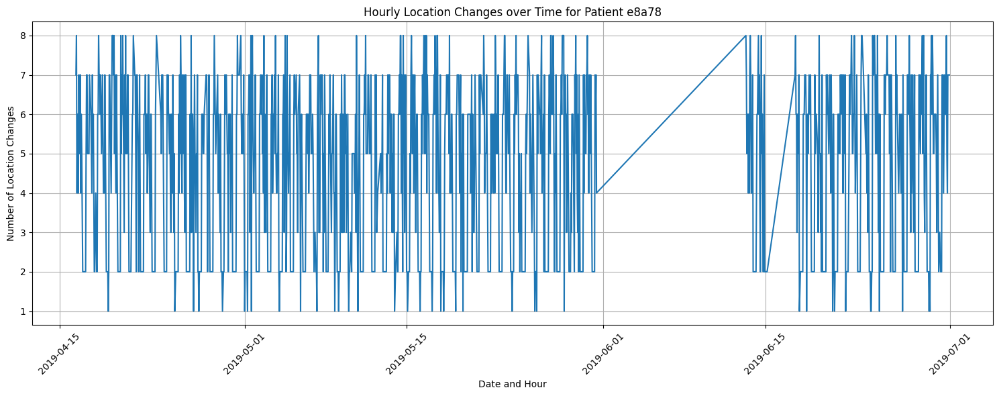

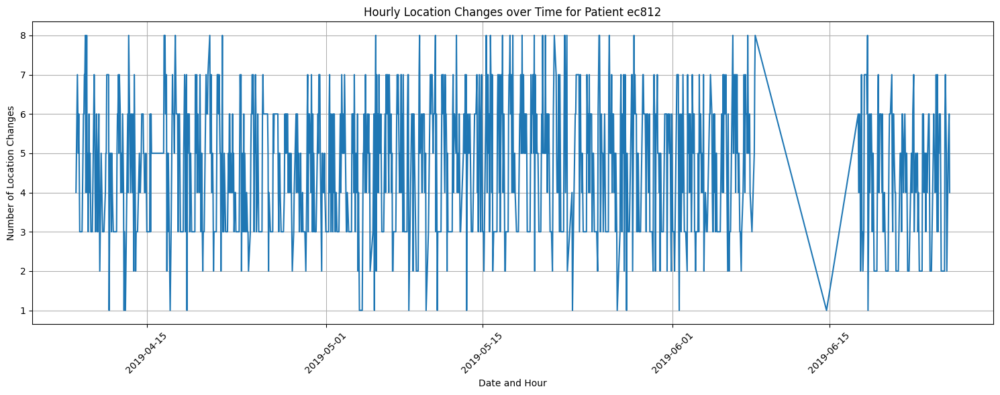

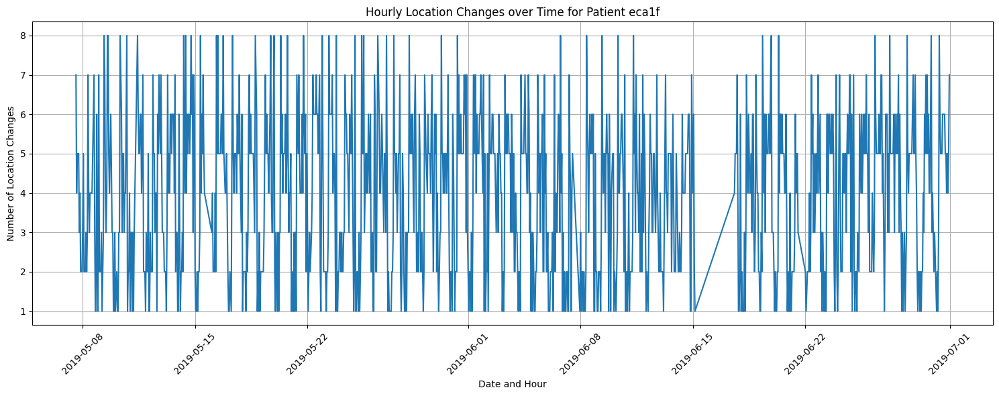

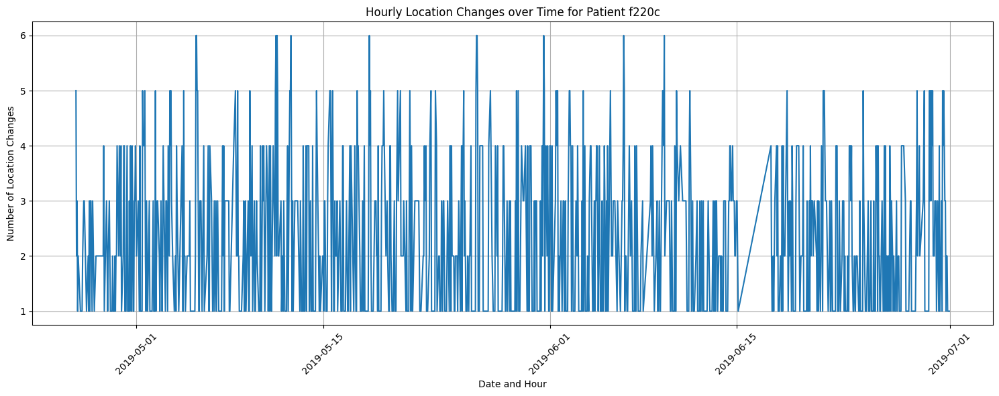

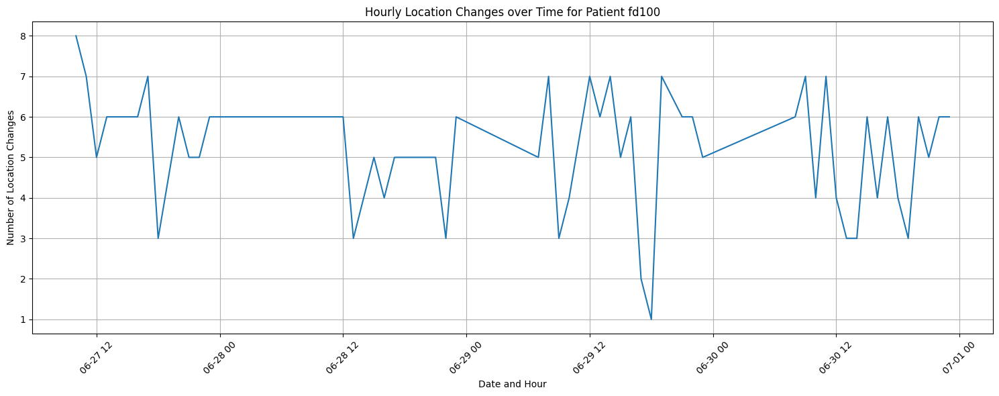

In [25]:
# traz gráficos de mudança de comodo por hora (Atividade) de cada um dos pacientes em série temporal
unique_patient_ids = df_activity_hourly_changes['patient_id'].unique()

for patient_id_to_plot in unique_patient_ids:
    patient_hourly_activity = df_activity_hourly_changes[df_activity_hourly_changes['patient_id'] == patient_id_to_plot].copy()

    # Combine 'day' and 'hour' columns into a datetime object for the x-axis
    patient_hourly_activity['datetime'] = pd.to_datetime(patient_hourly_activity['day'].astype(str) + ' ' + patient_hourly_activity['hour'].astype(str) + ':00:00')

    plt.figure(figsize=(15, 6))
    plt.plot(patient_hourly_activity['datetime'], patient_hourly_activity['hourly_location_changes'])
    plt.xlabel("Date and Hour")
    plt.ylabel("Number of Location Changes")
    plt.title(f"Hourly Location Changes over Time for Patient {patient_id_to_plot}")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

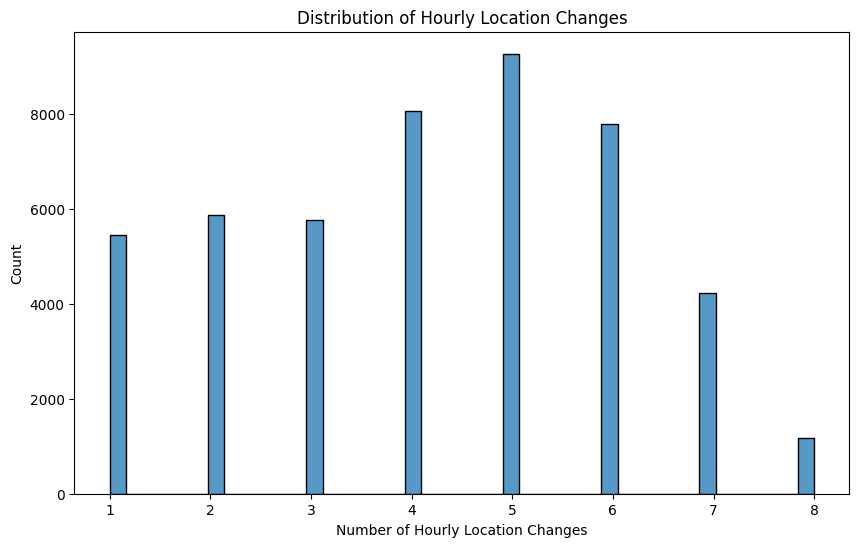

In [66]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df_activity_hourly_changes, x='hourly_location_changes')
plt.title('Distribution of Hourly Location Changes')
plt.xlabel('Number of Hourly Location Changes')
plt.ylabel('Count')
plt.show()

**DADOS FISIOLÓGICOS**

In [27]:
df_timh_Physiology = pd.read_csv("/content/drive/MyDrive/MESTRADO/CMP Aprendizado de Máquina/DATASETS/TIHM_Dataset/Dataset/Physiology.csv", sep = ",")
df_timh_Physiology.head()

,patient_id,date,device_type,value,unit
0,0697d,2019-06-28 13:42:09,Body Temperature,36.072,Cel
1,0697d,2019-06-28 13:42:44,Body Temperature,35.831,Cel
2,0697d,2019-06-28 13:43:40,Body Temperature,35.831,Cel
3,0697d,2019-06-28 13:45:15,Systolic blood pressure,165.000,mm[Hg]
4,0697d,2019-06-28 13:45:15,Diastolic blood pressure,82.000,mm[Hg]


In [28]:
df_timh_Physiology.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17679 entries, 0 to 17678
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   patient_id   17679 non-null  object 
 1   date         17679 non-null  object 
 2   device_type  17679 non-null  object 
 3   value        17679 non-null  float64
 4   unit         17679 non-null  object 
dtypes: float64(1), object(4)
memory usage: 690.7+ KB


In [29]:
len(df_timh_Physiology[df_timh_Physiology.duplicated()])

0

In [30]:
df_timh_Physiology.dtypes

,0
patient_id,object
date,object
device_type,object
value,float64
unit,object


In [31]:
df_timh_Physiology.describe(include='all')

,patient_id,date,device_type,value,unit
count,17679,17679,17679,17679.000000,17679
unique,55,9773,8,NaN,5
top,c55f8,2019-06-28 10:16:06,Body Temperature,NaN,Cel
freq,951,6,5617,NaN,6362
mean,NaN,NaN,NaN,64.766046,NaN
std,NaN,NaN,NaN,33.999335,NaN
min,NaN,NaN,NaN,29.082000,NaN
25%,NaN,NaN,NaN,36.599000,NaN
50%,NaN,NaN,NaN,54.800000,NaN
75%,NaN,NaN,NaN,79.000000,NaN


In [32]:
df_timh_Physiology.isnull().sum()

,0
patient_id,0
date,0
device_type,0
value,0
unit,0


In [33]:
df_timh_Physiology['device_type'].value_counts()

,count
device_type,
Body Temperature,5617
Systolic blood pressure,2305
Diastolic blood pressure,2305
Heart rate,2305
Body weight,1874
O/E - muscle mass,1264
Total body water,1264
Skin Temperature,745


In [34]:
df_timh_Physiology.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17679 entries, 0 to 17678
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   patient_id   17679 non-null  object 
 1   date         17679 non-null  object 
 2   device_type  17679 non-null  object 
 3   value        17679 non-null  float64
 4   unit         17679 non-null  object 
dtypes: float64(1), object(4)
memory usage: 690.7+ KB


In [35]:
df_timh_Physiology['date'] = pd.to_datetime(df_timh_Physiology['date'])

In [36]:
df_timh_Physiology['year'] = df_timh_Physiology['date'].dt.year
df_timh_Physiology['month'] = df_timh_Physiology['date'].dt.month
df_timh_Physiology['day'] = df_timh_Physiology['date'].dt.day
df_timh_Physiology['hour'] = df_timh_Physiology['date'].dt.hour
df_timh_Physiology['minute'] = df_timh_Physiology['date'].dt.minute
df_timh_Physiology['second'] = df_timh_Physiology['date'].dt.second

display(df_timh_Physiology.head())

,patient_id,date,device_type,value,unit,year,month,day,hour,minute,second
0,0697d,2019-06-28 13:42:09,Body Temperature,36.072,Cel,2019,6,28,13,42,9
1,0697d,2019-06-28 13:42:44,Body Temperature,35.831,Cel,2019,6,28,13,42,44
2,0697d,2019-06-28 13:43:40,Body Temperature,35.831,Cel,2019,6,28,13,43,40
3,0697d,2019-06-28 13:45:15,Systolic blood pressure,165.000,mm[Hg],2019,6,28,13,45,15
4,0697d,2019-06-28 13:45:15,Diastolic blood pressure,82.000,mm[Hg],2019,6,28,13,45,15


In [37]:
df_timh_Physiology.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17679 entries, 0 to 17678
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   patient_id   17679 non-null  object        
 1   date         17679 non-null  datetime64[ns]
 2   device_type  17679 non-null  object        
 3   value        17679 non-null  float64       
 4   unit         17679 non-null  object        
 5   year         17679 non-null  int32         
 6   month        17679 non-null  int32         
 7   day          17679 non-null  int32         
 8   hour         17679 non-null  int32         
 9   minute       17679 non-null  int32         
 10  second       17679 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(6), object(3)
memory usage: 1.1+ MB


In [39]:
# transforma a coluna device e seu respectivo valor em coluna específica para cada dado fisiológico

df_physiology_pivot = df_timh_Physiology.pivot_table(index=['patient_id', 'date'], columns='device_type', values='value').reset_index()

df_physiology_pivot['year'] = df_physiology_pivot['date'].dt.year
df_physiology_pivot['month'] = df_physiology_pivot['date'].dt.month
df_physiology_pivot['day'] = df_physiology_pivot['date'].dt.day
df_physiology_pivot['hour'] = df_physiology_pivot['date'].dt.hour
df_physiology_pivot['minute'] = df_physiology_pivot['date'].dt.minute
df_physiology_pivot['second'] = df_physiology_pivot['date'].dt.second

display(df_physiology_pivot.head())

device_type,patient_id,date,Body Temperature,Body weight,Diastolic blood pressure,Heart rate,O/E - muscle mass,Skin Temperature,Systolic blood pressure,Total body water,year,month,day,hour,minute,second
0,0697d,2019-06-28 13:42:09,36.072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,42,9
1,0697d,2019-06-28 13:42:44,35.831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,42,44
2,0697d,2019-06-28 13:43:40,35.831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,43,40
3,0697d,2019-06-28 13:45:15,NaN,NaN,82.0,42.0,NaN,NaN,165.0,NaN,2019,6,28,13,45,15
4,0697d,2019-06-28 14:25:07,36.599,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,14,25,7


In [40]:
df_physiology_pivot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9795 entries, 0 to 9794
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   patient_id                9795 non-null   object        
 1   date                      9795 non-null   datetime64[ns]
 2   Body Temperature          5617 non-null   float64       
 3   Body weight               1874 non-null   float64       
 4   Diastolic blood pressure  2305 non-null   float64       
 5   Heart rate                2305 non-null   float64       
 6   O/E - muscle mass         1264 non-null   float64       
 7   Skin Temperature          745 non-null    float64       
 8   Systolic blood pressure   2305 non-null   float64       
 9   Total body water          1264 non-null   float64       
 10  year                      9795 non-null   int32         
 11  month                     9795 non-null   int32         
 12  day                 

In [41]:
df_physiology_pivot.head()

device_type,patient_id,date,Body Temperature,Body weight,Diastolic blood pressure,Heart rate,O/E - muscle mass,Skin Temperature,Systolic blood pressure,Total body water,year,month,day,hour,minute,second
0,0697d,2019-06-28 13:42:09,36.072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,42,9
1,0697d,2019-06-28 13:42:44,35.831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,42,44
2,0697d,2019-06-28 13:43:40,35.831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,13,43,40
3,0697d,2019-06-28 13:45:15,NaN,NaN,82.0,42.0,NaN,NaN,165.0,NaN,2019,6,28,13,45,15
4,0697d,2019-06-28 14:25:07,36.599,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,6,28,14,25,7


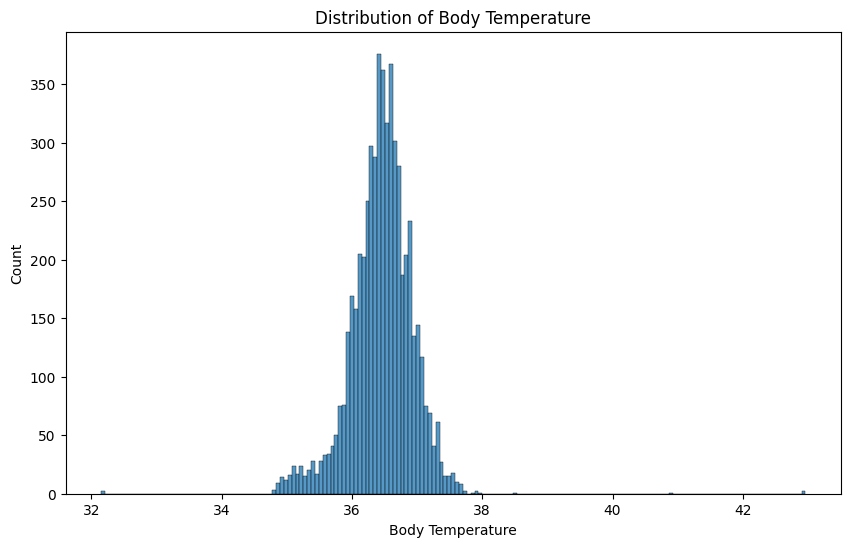

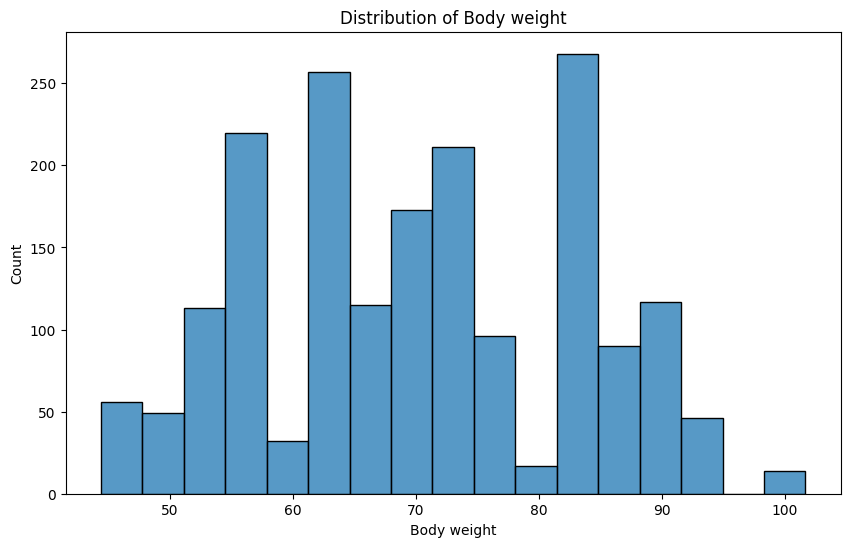

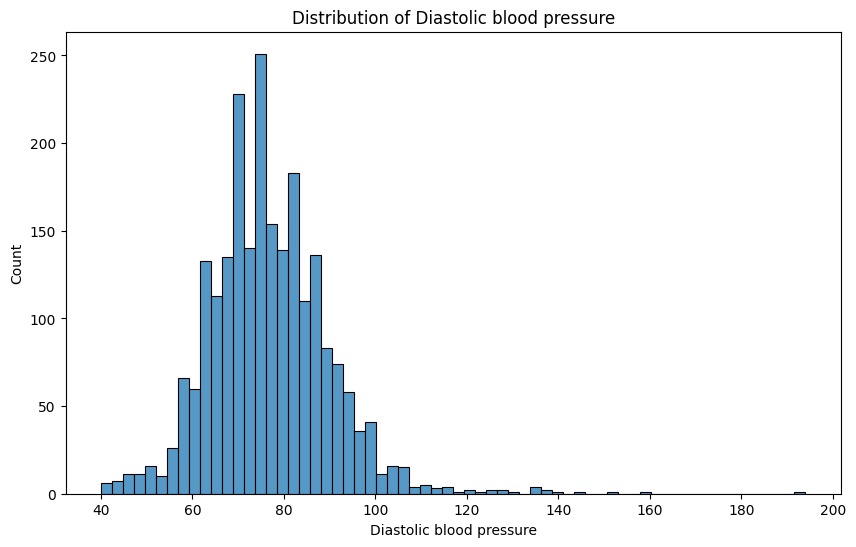

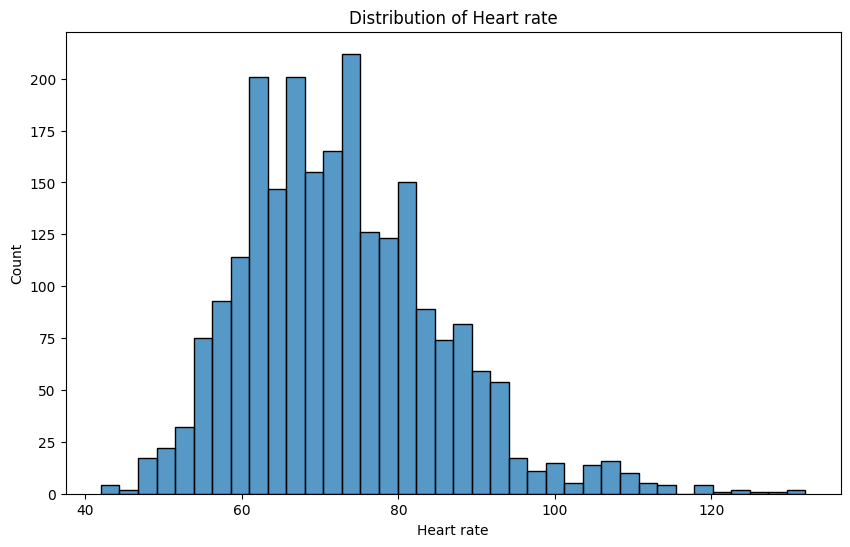

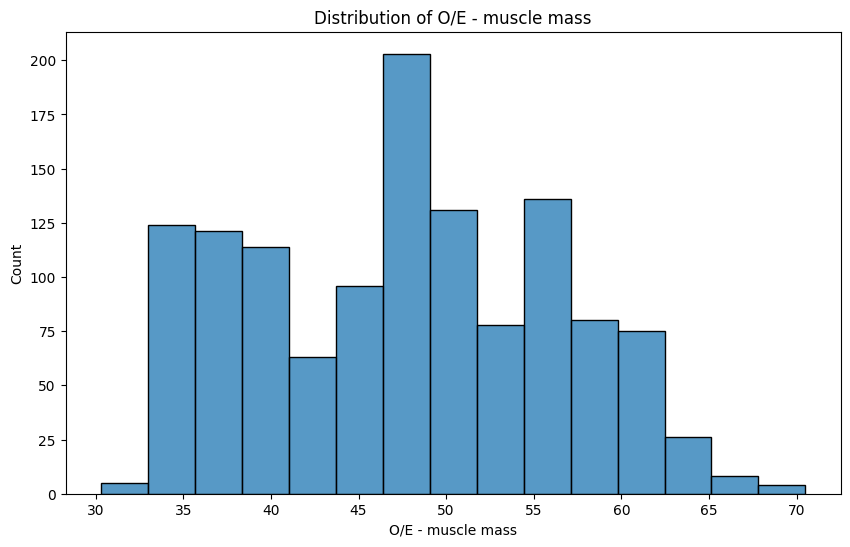

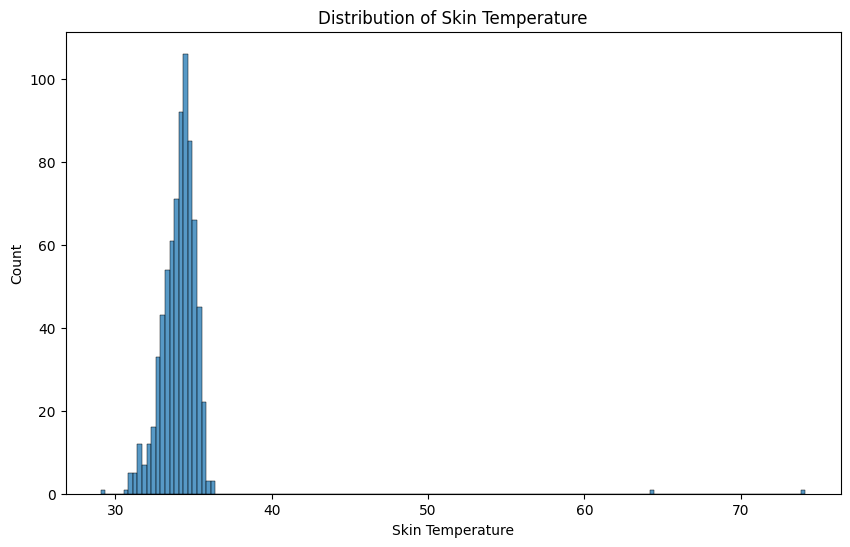

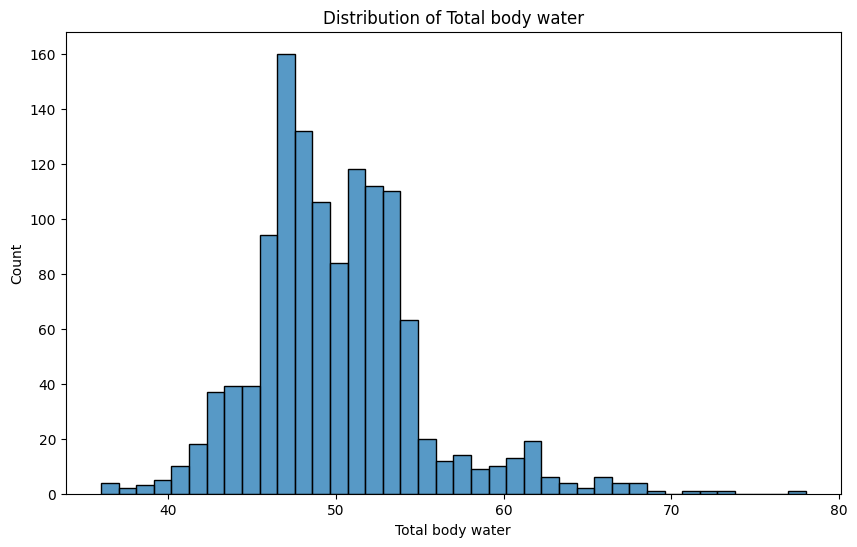

In [44]:
col_physiology = ['Body Temperature','Body weight', 'Diastolic blood pressure', 'Heart rate', 'O/E - muscle mass', 'Skin Temperature', 'Total body water']
for col in col_physiology:
  plt.figure(figsize=(10, 6))
  sns.histplot(data=df_physiology_pivot, x=col)
  plt.title(f'Distribution of {col}')
  plt.xlabel(col)
  plt.ylabel('Count')
  plt.show()

**SONO**

In [45]:
df_timh_Sleep = pd.read_csv("/content/drive/MyDrive/MESTRADO/CMP Aprendizado de Máquina/DATASETS/TIHM_Dataset/Dataset/Sleep.csv", sep = ",")
df_timh_Sleep.head()

,patient_id,date,state,heart_rate,respiratory_rate,snoring
0,0f352,2019-06-25 22:53:00,AWAKE,69.0,14.0,False
1,0f352,2019-06-25 22:54:00,AWAKE,66.0,14.0,False
2,0f352,2019-06-25 22:55:00,AWAKE,70.0,14.0,False
3,0f352,2019-06-25 22:56:00,AWAKE,70.0,13.0,False
4,0f352,2019-06-25 22:57:00,AWAKE,68.0,13.0,False


In [46]:
df_timh_Sleep.dtypes

,0
patient_id,object
date,object
state,object
heart_rate,float64
respiratory_rate,float64
snoring,bool


In [47]:
df_timh_Sleep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 461423 entries, 0 to 461422
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   patient_id        461423 non-null  object 
 1   date              461423 non-null  object 
 2   state             461423 non-null  object 
 3   heart_rate        461423 non-null  float64
 4   respiratory_rate  461423 non-null  float64
 5   snoring           461423 non-null  bool   
dtypes: bool(1), float64(2), object(3)
memory usage: 18.0+ MB


In [48]:
df_timh_Sleep.isnull().sum()

,0
patient_id,0
date,0
state,0
heart_rate,0
respiratory_rate,0
snoring,0


In [49]:
len(df_timh_Sleep[df_timh_Sleep.duplicated()])

0

In [50]:
df_timh_Sleep['date'] = pd.to_datetime(df_timh_Sleep['date'])
display(df_timh_Sleep.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 461423 entries, 0 to 461422
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   patient_id        461423 non-null  object        
 1   date              461423 non-null  datetime64[ns]
 2   state             461423 non-null  object        
 3   heart_rate        461423 non-null  float64       
 4   respiratory_rate  461423 non-null  float64       
 5   snoring           461423 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), object(2)
memory usage: 18.0+ MB


None

In [51]:
df_timh_Sleep['year'] = df_timh_Sleep['date'].dt.year
df_timh_Sleep['month'] = df_timh_Sleep['date'].dt.month
df_timh_Sleep['day'] = df_timh_Sleep['date'].dt.day
df_timh_Sleep['hour'] = df_timh_Sleep['date'].dt.hour
df_timh_Sleep['minute'] = df_timh_Sleep['date'].dt.minute
df_timh_Sleep['second'] = df_timh_Sleep['date'].dt.second

display(df_timh_Sleep.head())

,patient_id,date,state,heart_rate,respiratory_rate,snoring,year,month,day,hour,minute,second
0,0f352,2019-06-25 22:53:00,AWAKE,69.0,14.0,False,2019,6,25,22,53,0
1,0f352,2019-06-25 22:54:00,AWAKE,66.0,14.0,False,2019,6,25,22,54,0
2,0f352,2019-06-25 22:55:00,AWAKE,70.0,14.0,False,2019,6,25,22,55,0
3,0f352,2019-06-25 22:56:00,AWAKE,70.0,13.0,False,2019,6,25,22,56,0
4,0f352,2019-06-25 22:57:00,AWAKE,68.0,13.0,False,2019,6,25,22,57,0


In [53]:
df_timh_Sleep.describe(include='all')

,patient_id,date,state,heart_rate,respiratory_rate,snoring,year,month,day,hour,minute,second
count,461423,461423,461423,461423.00000,461423.000000,461423,461423.0,461423.000000,461423.000000,461423.000000,461423.000000,461423.0
unique,17,NaN,4,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN
top,c55f8,NaN,LIGHT,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN
freq,46001,NaN,239102,NaN,NaN,445404,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2019-05-27 01:37:35.872464128,NaN,60.87889,15.063545,NaN,2019.0,5.317136,16.735882,8.516645,29.484755,0.0
min,NaN,2019-04-01 00:00:00,NaN,38.00000,8.000000,NaN,2019.0,4.000000,1.000000,0.000000,0.000000,0.0
25%,NaN,2019-05-10 22:44:00,NaN,55.00000,13.000000,NaN,2019.0,5.000000,9.000000,2.000000,14.000000,0.0
50%,NaN,2019-05-28 01:49:00,NaN,60.00000,15.000000,NaN,2019.0,5.000000,17.000000,5.000000,29.000000,0.0
75%,NaN,2019-06-14 03:15:00,NaN,66.00000,16.000000,NaN,2019.0,6.000000,25.000000,18.000000,44.000000,0.0
max,NaN,2019-06-30 23:59:00,NaN,107.00000,31.000000,NaN,2019.0,6.000000,31.000000,23.000000,59.000000,0.0


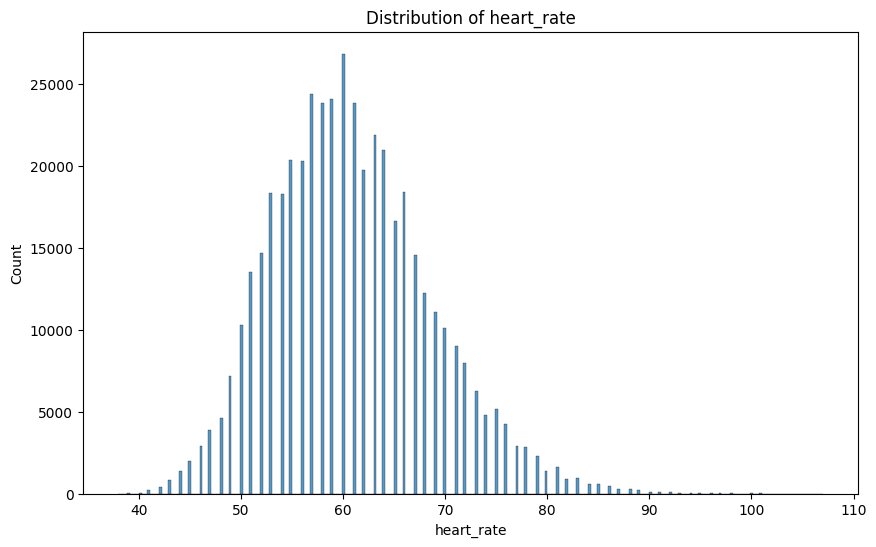

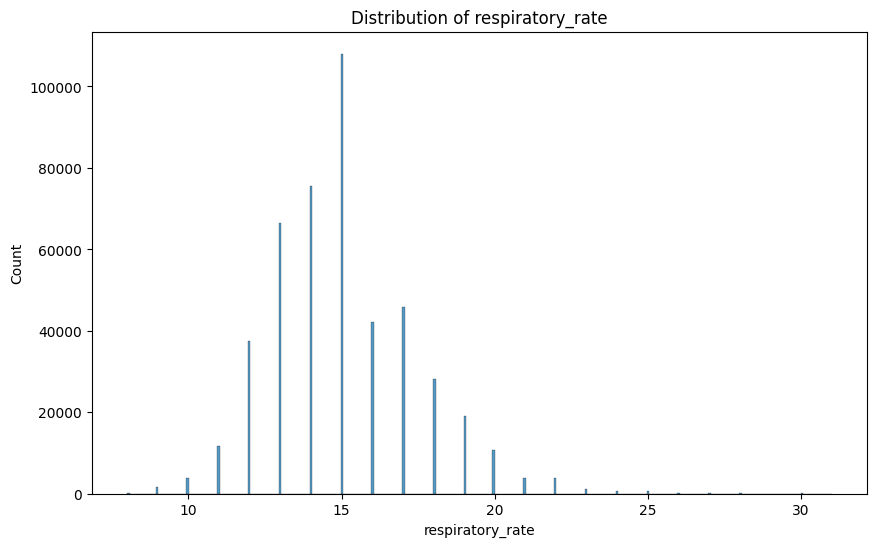

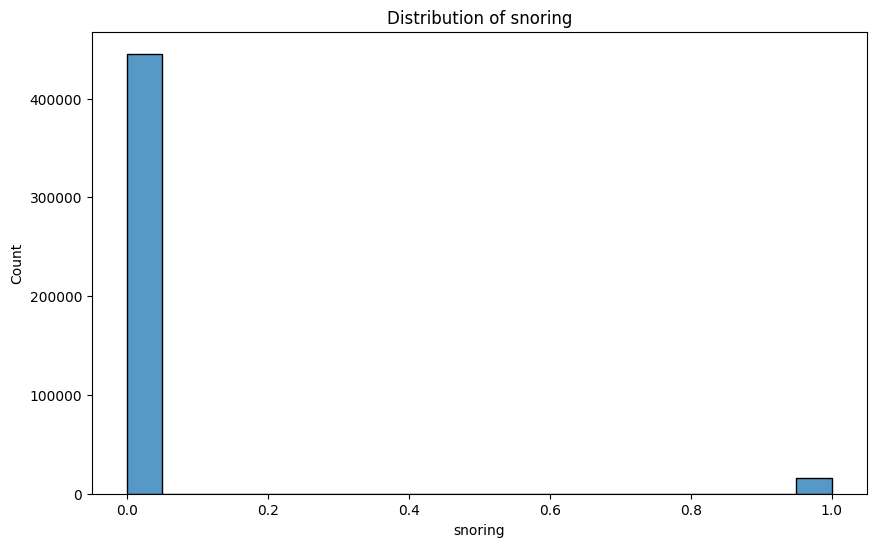

In [54]:
col_sleep = ['heart_rate','respiratory_rate','snoring']
for col in col_sleep:
  plt.figure(figsize=(10, 6))
  sns.histplot(data=df_timh_Sleep, x=col)
  plt.title(f'Distribution of {col}')
  plt.xlabel(col)
  plt.ylabel('Count')
  plt.show()

**EVENTOS ADVERSOS - TARGET**

In [55]:
df_timh_Labels= pd.read_csv("/content/drive/MyDrive/MESTRADO/CMP Aprendizado de Máquina/DATASETS/TIHM_Dataset/Dataset/Labels.csv", sep = ",")
df_timh_Labels.head()

,patient_id,date,type
0,c55f8,2019-04-04 09:10:21,Blood pressure
1,16f4b,2019-04-08 13:40:20,Blood pressure
2,16f4b,2019-04-11 12:00:22,Agitation
3,ec812,2019-04-12 09:10:29,Blood pressure
4,16f4b,2019-04-14 12:00:07,Agitation


In [56]:
df_timh_Labels.dtypes

,0
patient_id,object
date,object
type,object


In [57]:
df_timh_Labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608 entries, 0 to 607
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  608 non-null    object
 1   date        608 non-null    object
 2   type        608 non-null    object
dtypes: object(3)
memory usage: 14.4+ KB


In [58]:
df_timh_Labels['date'] = pd.to_datetime(df_timh_Labels['date'])
display(df_timh_Labels.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608 entries, 0 to 607
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   patient_id  608 non-null    object        
 1   date        608 non-null    datetime64[ns]
 2   type        608 non-null    object        
dtypes: datetime64[ns](1), object(2)
memory usage: 14.4+ KB


None

In [59]:
df_timh_Labels['year'] = df_timh_Labels['date'].dt.year
df_timh_Labels['month'] = df_timh_Labels['date'].dt.month
df_timh_Labels['day'] = df_timh_Labels['date'].dt.day
df_timh_Labels['hour'] = df_timh_Labels['date'].dt.hour
df_timh_Labels['minute'] = df_timh_Labels['date'].dt.minute
df_timh_Labels['second'] = df_timh_Labels['date'].dt.second

display(df_timh_Labels.head())

,patient_id,date,type,year,month,day,hour,minute,second
0,c55f8,2019-04-04 09:10:21,Blood pressure,2019,4,4,9,10,21
1,16f4b,2019-04-08 13:40:20,Blood pressure,2019,4,8,13,40,20
2,16f4b,2019-04-11 12:00:22,Agitation,2019,4,11,12,0,22
3,ec812,2019-04-12 09:10:29,Blood pressure,2019,4,12,9,10,29
4,16f4b,2019-04-14 12:00:07,Agitation,2019,4,14,12,0,7


In [60]:
df_timh_Labels.describe(include='all')

,patient_id,date,type,year,month,day,hour,minute,second
count,608,608,608,608.0,608.000000,608.000000,608.000000,608.000000,608.000000
unique,49,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN
top,0cda9,NaN,Blood pressure,NaN,NaN,NaN,NaN,NaN,NaN
freq,55,NaN,305,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2019-05-29 01:32:28.547697408,NaN,2019.0,5.389803,16.427632,11.297697,18.055921,30.324013
min,NaN,2019-04-04 09:10:21,NaN,2019.0,4.000000,1.000000,8.000000,0.000000,0.000000
25%,NaN,2019-05-17 18:38:21.249999872,NaN,2019.0,5.000000,8.000000,8.000000,1.000000,17.000000
50%,NaN,2019-05-29 11:11:07,NaN,2019.0,5.000000,18.000000,10.000000,10.000000,33.000000
75%,NaN,2019-06-10 10:45:40.750000128,NaN,2019.0,6.000000,25.000000,14.000000,40.000000,43.000000
max,NaN,2019-06-30 14:20:25,NaN,2019.0,6.000000,31.000000,19.000000,51.000000,59.000000


In [61]:
df_timh_Labels.isnull().sum()

,0
patient_id,0
date,0
type,0
year,0
month,0
day,0
hour,0
minute,0
second,0


In [62]:
len(df_timh_Labels[df_timh_Labels.duplicated()])

0

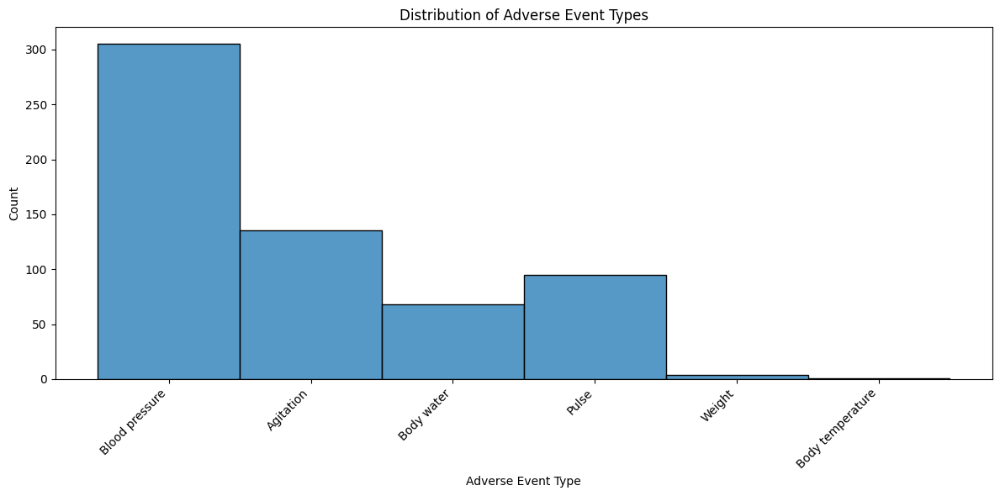

In [64]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_timh_Labels, x='type')
plt.title('Distribution of Adverse Event Types')
plt.xlabel('Adverse Event Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()